Eliminar archivos yaml

In [1]:
import os

def eliminar_archivos_yaml(ruta):
    # Recorre cada elemento en la ruta proporcionada
    for elemento in os.listdir(ruta):
        # Obtiene la ruta completa del elemento
        ruta_completa = os.path.join(ruta, elemento)
        # Si es un archivo .yaml, elimínalo
        if os.path.isfile(ruta_completa) and elemento.endswith('.yaml'):
            os.remove(ruta_completa)
            print(f"Se ha eliminado el archivo: {ruta_completa}")
        # Si es una carpeta, llama recursivamente a la función para eliminar archivos .yaml en esa carpeta
        elif os.path.isdir(ruta_completa):
            eliminar_archivos_yaml(ruta_completa)

# Ruta de la carpeta principal
carpeta_principal = 'images4'

# Llama a la función para eliminar archivos .yaml en la carpeta principal y sus subcarpetas
eliminar_archivos_yaml(carpeta_principal)

Se ha eliminado el archivo: images4/S111/d12/f27/params_i3.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i2.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i10.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i5.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i9.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i8.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i4.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i11.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i7.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i12.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i13.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i6.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i1.yaml
Se ha eliminado el archivo: images4/S111/d12/f27/params_i0.yaml
Se ha eliminado el archivo: images4/S111/d12/f836/params_i3.yaml
Se ha eliminado el archivo: images4

Mostrar imágenes junto con focal y distancia

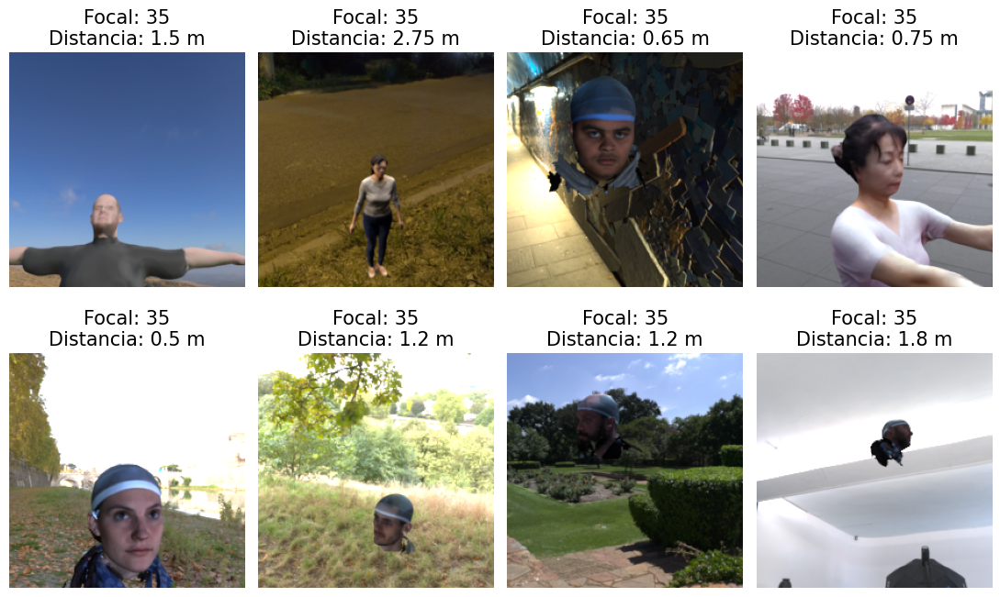

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import random

# Cargar el archivo CSV
df = pd.read_csv('labels_nuevas_no_server.csv')

# Lista de nombres de imágenes específicas que deseas mostrar
#nombres_especificos = ['S132d35f53_i0', 'S140d4f53_i3', 'S2d6f836_i12', 'S122d05f836_i12', 'S138d065f35_i2', 'S171d05f35_i10', 'S10d06f27_i12', 'S148d18f27_i10']  # Añade aquí los nombres de las imágenes específicas que desees mostrar
nombres_especificos = []

# Filtrar filas que contienen las imágenes específicas
filas_especificas = df[df['Image'].isin(nombres_especificos)]

# Seleccionar imágenes aleatorias para completar hasta 8 imágenes
num_imagenes_aleatorias = 8 - len(filas_especificas)
filas_aleatorias = df.sample(n=num_imagenes_aleatorias)

# Combinar filas específicas y aleatorias
filas_combinadas = pd.concat([filas_especificas, filas_aleatorias])

# Crear un subplot de 2x4
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(11, 7))

# Iterar sobre las filas seleccionadas y mostrar las imágenes junto con los datos
for i, (index, row) in enumerate(filas_combinadas.iterrows()):
    path = row['Path']
    subject = row['Subject']
    focal = row['Focal']
    distance = row['Distance']
    
    # Calcular la posición en el subplot
    row_index = i // 4
    col_index = i % 4
    
    # Mostrar la imagen en el subplot correspondiente
    img = Image.open(path)
    axes[row_index, col_index].imshow(img)
    axes[row_index, col_index].set_title(f'Focal: {focal}\nDistancia: {distance} m', fontsize=15)
    axes[row_index, col_index].axis('off')

# Ajustar el diseño
plt.tight_layout()

# plt.savefig("ejemplos_dataset.png", dpi=300)

# Mostrar la figura
plt.show()


Imágenes a distintos ángulos

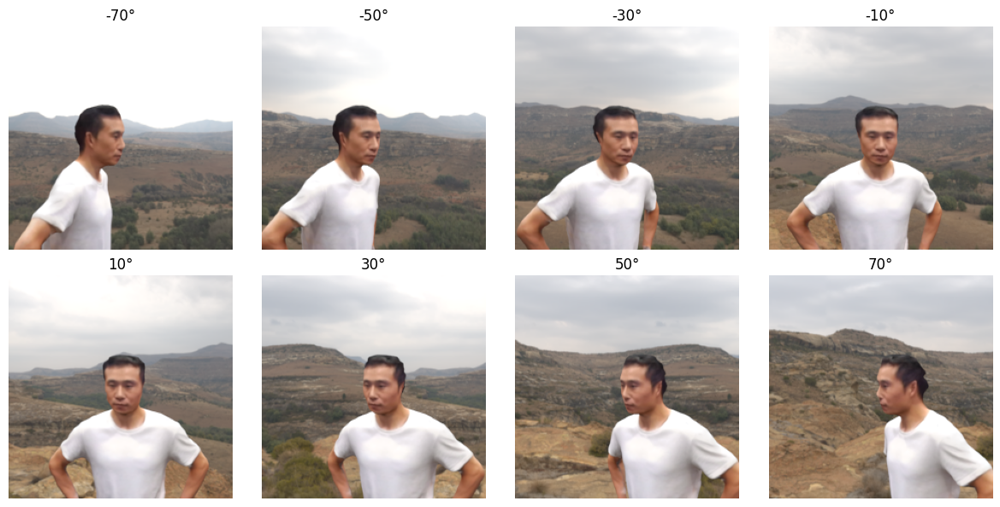

In [2]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def mostrar_imagenes_en_cuadricula(directorio, nombre_salida):
    # Obtener la lista de archivos en el directorio
    archivos = os.listdir(directorio)
    # Filtrar solo los archivos de imagen
    imagenes = [archivo for archivo in archivos if archivo.endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp'))]
    
    num_imagenes = len(imagenes)
    fig, axs = plt.subplots(2, 4, figsize=(12, 6))
    
    # Ordenar las imágenes por nombre de archivo
    imagenes_ordenadas = sorted(imagenes)
    
    for i in range(2):
        for j in range(4):
            index = i * 4 + j
            if index < num_imagenes:
                img = mpimg.imread(os.path.join(directorio, imagenes_ordenadas[index]))
                axs[i, j].imshow(img)
                axs[i, j].axis('off')
                # Calcular el ángulo para el título
                angulo = index * 20 - 70
                axs[i, j].set_title(f'{angulo}°')
    
    # Ajustar el espacio entre subtramas
    plt.tight_layout()
    
    # Guardar la figura
    plt.savefig(nombre_salida, dpi=300)
    plt.show()

# Directorio que contiene las imágenes
directorio = '/Users/ivansalinas/GitHub/TFG/Procesamiento de modelos/images_memoria/S130_rot_horizontal/d15/f53/'
# Nombre de archivo de salida
nombre_salida = 'imagenes_rotacion_horizontal.png'

mostrar_imagenes_en_cuadricula(directorio, nombre_salida)


In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def mostrar_imagenes_en_fila(directorio, nombre_salida):
    # Obtener la lista de archivos en el directorio
    archivos = os.listdir(directorio)
    # Filtrar solo los archivos de imagen
    imagenes = [archivo for archivo in archivos if archivo.endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp'))]
    
    num_imagenes = len(imagenes)
    fig, axs = plt.subplots(1, num_imagenes, figsize=(12, 3))
    
    # Ordenar las imágenes por nombre de archivo
    imagenes_ordenadas = sorted(imagenes)
    
    for i in range(num_imagenes):
        img = mpimg.imread(os.path.join(directorio, imagenes_ordenadas[i]))
        axs[i].imshow(img)
        axs[i].axis('off')
        # Calcular el ángulo para el título
        angulo = i * 20 - 30
        axs[i].set_title(f'{angulo}°', fontsize=15)
    
    # Ajustar el espacio entre subtramas
    plt.tight_layout()
    
    # Guardar la figura
    plt.savefig(nombre_salida, dpi=300)
    plt.show()

# Directorio que contiene las imágenes
directorio = '/Users/ivansalinas/GitHub/TFG/Procesamiento de modelos/images_memoria/S130_rot_vertical/d15/f53/'
# Nombre de archivo de salida
nombre_salida = 'imagenes_rotacion_vertical.png'

mostrar_imagenes_en_fila(directorio, nombre_salida)

In [1]:
import os

def rename_unknown_files(folder_path, unknown_word):
    # Obtener la lista de archivos en la carpeta
    files = os.listdir(folder_path)
    
    # Recorrer todos los archivos en la carpeta
    for filename in files:
        # Comprobar si el archivo contiene la palabra desconocida
        if unknown_word in filename:
            # Crear el nuevo nombre de archivo reemplazando la palabra desconocida
            new_filename = filename.replace(unknown_word, "unknown")
            
            # Obtener la ruta completa del archivo original y el nuevo archivo
            old_filepath = os.path.join(folder_path, filename)
            new_filepath = os.path.join(folder_path, new_filename)
            
            # Renombrar el archivo
            os.rename(old_filepath, new_filepath)
            print(f"Archivo renombrado: {filename} -> {new_filename}")

# Ejemplo de uso
folder_path = "unkown"
unknown_word = "unkown"  # Palabra desconocida a reemplazar
rename_unknown_files(folder_path, unknown_word)

Archivo renombrado: unkown_90930_3.jpg -> unknown_90930_3.jpg
Archivo renombrado: unkown_67206_3.jpg -> unknown_67206_3.jpg
Archivo renombrado: unkown_96463_3.jpg -> unknown_96463_3.jpg
Archivo renombrado: unkown_104584_3.jpg -> unknown_104584_3.jpg
Archivo renombrado: unkown_13537.jpg -> unknown_13537.jpg
Archivo renombrado: unkown_9810_3.jpg -> unknown_9810_3.jpg
Archivo renombrado: unkown_75975_2.jpg -> unknown_75975_2.jpg
Archivo renombrado: unkown_52434_3.jpg -> unknown_52434_3.jpg
Archivo renombrado: unkown_45942.jpg -> unknown_45942.jpg
Archivo renombrado: unkown_40184.jpg -> unknown_40184.jpg
Archivo renombrado: unkown_3083.jpg -> unknown_3083.jpg
Archivo renombrado: unkown_99804_3.jpg -> unknown_99804_3.jpg
Archivo renombrado: unkown_4701_3.jpg -> unknown_4701_3.jpg
Archivo renombrado: unkown_29043_3.jpg -> unknown_29043_3.jpg
Archivo renombrado: unkown_77019_2.jpg -> unknown_77019_2.jpg
Archivo renombrado: unkown_27950_3.jpg -> unknown_27950_3.jpg
Archivo renombrado: unkown_8

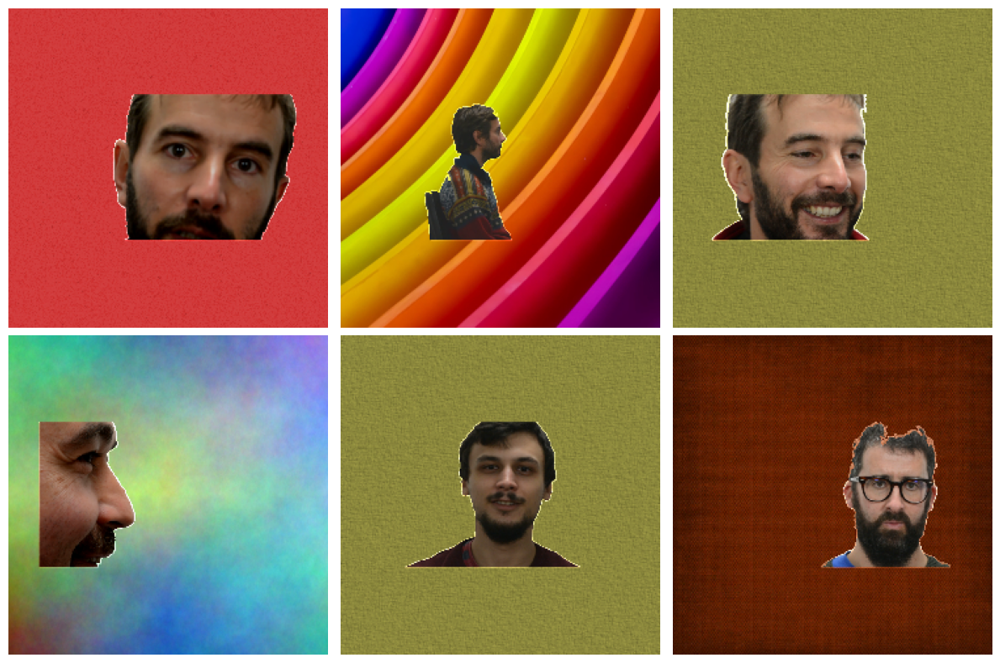

In [1]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def create_figure(images_dir, save_path):
    # Obtener la lista de archivos de imagen en el directorio
    image_files = [f for f in os.listdir(images_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]
    
    # Verificar si hay suficientes imágenes
    if len(image_files) < 6:
        print("No hay suficientes imágenes en el directorio.")
        return
    
    # Crear una figura con 2 filas y 3 columnas
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    
    # Iterar sobre las imágenes y mostrarlas en la figura
    for i, image_file in enumerate(image_files[:6]):
        row = i // 3
        col = i % 3
        image_path = os.path.join(images_dir, image_file)
        image = mpimg.imread(image_path)
        axes[row, col].imshow(image)
        axes[row, col].axis('off')  # Ocultar ejes
        
    # Guardar la figura
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

# Directorio de las imágenes
images_dir = "imagenes_FSCDNET"

# Ruta donde se guardará la figura
save_path = "figura_FSCDnet.png"

# Crear la figura
create_figure(images_dir, save_path)


In [51]:
import os
import random
import shutil

def buscar_archivos(directorio):
    archivos_obj = set()
    archivos_mtl = set()
    archivos_jpg = set()

    # Iterar sobre los archivos y subdirectorios del directorio dado
    for directorio_raiz, directorios, archivos in os.walk(directorio):
        # Iterar sobre los archivos en el directorio actual
        for archivo in archivos:
            # Verificar si el archivo es .obj, .mtl o .jpg
            if archivo.endswith('.obj'):
                archivos_obj.add(os.path.splitext(archivo)[0].split('_')[0])  # Obtener la parte izquierda del `_` sin la extensión
            elif archivo.endswith('.mtl'):
                archivos_mtl.add(os.path.splitext(archivo)[0].split('_')[0])
            elif archivo.endswith('.jpg'):
                archivos_jpg.add(os.path.splitext(archivo)[0].split('_')[0])

    # Intersección de los conjuntos para encontrar archivos que contienen los tres tipos de archivos
    archivos_comunes = archivos_obj.intersection(archivos_mtl, archivos_jpg)

    return archivos_comunes

def mover_archivos(directorio, archivos_comunes):
    # Crear una carpeta para los modelos
    if not os.path.exists(os.path.join(directorio, "modelos")):
        os.makedirs(os.path.join(directorio, "modelos"))

    # Crear un contador para numerar las carpetas de modelos
    i = 35

    # Iterar sobre los archivos comunes y moverlos
    for archivo_base in archivos_comunes:
        # Encontrar un archivo .obj aleatorio con el mismo nombre base
        archivos_obj = [f for f in os.listdir(directorio) if f.startswith(archivo_base) and f.endswith('.obj')]
        if archivos_obj:
            archivo_obj_aleatorio = random.choice(archivos_obj)

            # Crear una carpeta modelo_i y mover los archivos correspondientes
            modelo_dir = os.path.join(directorio, "modelos", f"modelo_{i}")
            os.makedirs(modelo_dir)
            shutil.move(os.path.join(directorio, archivo_obj_aleatorio), modelo_dir)
            shutil.move(os.path.join(directorio, os.path.splitext(archivo_obj_aleatorio)[0] + '.mtl'), modelo_dir)
            shutil.move(os.path.join(directorio, os.path.splitext(archivo_obj_aleatorio)[0] + '.jpg'), modelo_dir)

            # Incrementar el contador
            i += 1

directorio = "results/Stirling DB"
archivos = buscar_archivos(directorio)
print("Archivos que contienen .obj, .mtl y .jpg:")
print(len(archivos))

mover_archivos(directorio, list(archivos)[:15])

Archivos que contienen .obj, .mtl y .jpg:
35


In [29]:
import os
import random
import shutil

def seleccionar_nombre_aleatorio(subcarpeta):
    archivos = [archivo.split('.')[0] for archivo in os.listdir(subcarpeta) if os.path.isfile(os.path.join(subcarpeta, archivo))]
    if archivos:
        nombre_aleatorio = random.choice(archivos)
        return nombre_aleatorio
    else:
        return None

def mover_archivos_con_extension(subcarpeta, nombre, carpeta_destino):
    for extension in ['.jpg', '.mtl', '.obj']:
        archivo = nombre + extension
        if os.path.exists(os.path.join(subcarpeta, archivo)):
            shutil.copy(os.path.join(subcarpeta, archivo), os.path.join(carpeta_destino, archivo))

def procesar_carpetas(carpeta_principal, carpeta_destino):
    for dirpath, _, _ in os.walk(carpeta_principal):
        if dirpath != carpeta_principal:  # Evitar procesar la carpeta principal
            subcarpeta = dirpath
            nombre_aleatorio = seleccionar_nombre_aleatorio(subcarpeta)
            if nombre_aleatorio:
                mover_archivos_con_extension(subcarpeta, nombre_aleatorio, carpeta_destino)

if __name__ == "__main__":
    carpeta_principal = "/Users/ivansalinas/GitHub/TFG/Procesamiento de modelos/results/DI4D_UGR_ANON"
    carpeta_destino = "/Users/ivansalinas/GitHub/TFG/Procesamiento de modelos/results/DI4D_UGR_ANON_procesado"

    if not os.path.exists(carpeta_destino):
        os.makedirs(carpeta_destino)

    procesar_carpetas(carpeta_principal, carpeta_destino)

    print("Proceso completado.")

Proceso completado.


In [31]:
import os

def limpiar_directorio(directorio):
    # Lista de archivos permitidos
    archivos_permitidos = ['000000_0.png', '000000.mtl', '000000.obj']

    try:
        # Iterar sobre todos los archivos y directorios en el directorio
        for elemento in os.listdir(directorio):
            ruta_elemento = os.path.join(directorio, elemento)
            
            # Verificar si el elemento es un archivo
            if os.path.isfile(ruta_elemento):
                # Verificar si el archivo no está en la lista de permitidos
                if elemento not in archivos_permitidos:
                    # Borrar el archivo
                    os.remove(ruta_elemento)
                    print(f"Archivo borrado: {elemento}")
                else:
                    print(f"Archivo conservado: {elemento}")
            # Verificar si el elemento es un directorio
            elif os.path.isdir(ruta_elemento):
                # Llamar recursivamente a la función para limpiar el directorio
                limpiar_directorio(ruta_elemento)
                print(f"Directorio limpiado: {ruta_elemento}")

        print(f"Limpieza de {directorio} completada.")
    except Exception as e:
        print(f"Error al limpiar el directorio {directorio}: {e}")

# Ruta del directorio a limpiar
directorio_a_limpiar = "/Users/ivansalinas/GitHub/TFG/Procesamiento de modelos/results/HuMMan a procesar"

# Llamar a la función para limpiar el directorio
limpiar_directorio(directorio_a_limpiar)

Archivo borrado: .DS_Store
Archivo borrado: 000048.mtl
Archivo borrado: 000060.mtl
Archivo borrado: 000042.obj
Archivo borrado: 000090_0.png
Archivo borrado: 000096.obj
Archivo borrado: 000054.obj
Archivo borrado: 000102.mtl
Archivo borrado: 000066.mtl
Archivo borrado: 000072.mtl
Archivo borrado: 000078.obj
Archivo borrado: 000054_0.png
Archivo borrado: 000096_0.png
Archivo borrado: 000084.obj
Archivo borrado: 000090.obj
Archivo borrado: 000072_0.png
Archivo borrado: 000048_0.png
Archivo borrado: 000030_0.png
Archivo conservado: 000000.mtl
Archivo borrado: 000036.obj
Archivo borrado: 000012_0.png
Archivo borrado: 000036_0.png
Archivo borrado: 000012.mtl
Archivo borrado: 000006.mtl
Archivo borrado: 000024.obj
Archivo borrado: 000030.obj
Archivo borrado: 000018.obj
Archivo borrado: 000036.mtl
Archivo conservado: 000000.obj
Archivo borrado: 000042_0.png
Archivo borrado: 000066_0.png
Archivo borrado: 000024.mtl
Archivo borrado: 000030.mtl
Archivo borrado: 000018.mtl
Archivo borrado: 000012

In [33]:
import os

def obtener_numeros_directorio(directorio):
    numeros = []
    # Obtener la lista de directorios en el directorio dado
    directorios = os.listdir(directorio)
    # Iterar sobre los directorios
    for carpeta in directorios:
        # Verificar si la carpeta sigue el formato "modelo_numero"
        if carpeta.startswith("modelo_"):
            # Extraer el número de la carpeta
            numero = carpeta.split("_")[1]
            numeros.append(numero)
    return numeros

# Directorio que contiene las carpetas
directorio = "models/HeadSpace"
numeros = obtener_numeros_directorio(directorio)
print("Lista de números encontrados en las carpetas:")
print(numeros)


Lista de números encontrados en las carpetas:
['633', '250', '693', '497', '251', '269', '260', '604', '1081', '39', '1086', '498', '834', '63', '941', '747', '520', '922', '748', '104', '505', '739', '706', '5', '908', '330', '503', '440', '681', '23', '12', '448', '286', '1012', '663', '209', '1070', '862', '698', '839', '897', '638', '772', '576', '728', '389', '513', '980', '928', '321', '1102', '541', '780', '959', '733', '332', '597', '904', '199', '704', '500', '351', '759', '750', '106', '1054', '877', '1053', '11', '486', '442', '72', '489']


In [37]:
import os

def rename_folders(directory):
    # Obtener la lista de carpetas en el directorio y filtrar los archivos ocultos
    folders = [folder for folder in os.listdir(directory) if not folder.startswith('.')]
    # Ordenar las carpetas
    folders.sort(key=lambda x: int(x))
    
    # Iterar sobre las carpetas
    for i, folder in enumerate(folders):
        # Crear el nuevo nombre
        new_name = f"modelo_{i}"
        
        # Obtener la ruta completa de la carpeta antigua y nueva
        old_path = os.path.join(directory, folder)
        new_path = os.path.join(directory, new_name)
        
        # Renombrar la carpeta
        os.rename(old_path, new_path)
        print(f"Renombrada {old_path} a {new_path}")

# Directorio donde están las carpetas
directory_path = "results/HeadSpace"

# Llamar a la función para renombrar las carpetas
rename_folders(directory_path)

Renombrada results/HeadSpace/00001 a results/HeadSpace/modelo_0
Renombrada results/HeadSpace/00002 a results/HeadSpace/modelo_1
Renombrada results/HeadSpace/00003 a results/HeadSpace/modelo_2
Renombrada results/HeadSpace/00004 a results/HeadSpace/modelo_3
Renombrada results/HeadSpace/00005 a results/HeadSpace/modelo_4
Renombrada results/HeadSpace/00006 a results/HeadSpace/modelo_5
Renombrada results/HeadSpace/00007 a results/HeadSpace/modelo_6
Renombrada results/HeadSpace/00008 a results/HeadSpace/modelo_7
Renombrada results/HeadSpace/00009 a results/HeadSpace/modelo_8
Renombrada results/HeadSpace/00010 a results/HeadSpace/modelo_9
Renombrada results/HeadSpace/00011 a results/HeadSpace/modelo_10
Renombrada results/HeadSpace/00012 a results/HeadSpace/modelo_11
Renombrada results/HeadSpace/00013 a results/HeadSpace/modelo_12
Renombrada results/HeadSpace/00014 a results/HeadSpace/modelo_13
Renombrada results/HeadSpace/00015 a results/HeadSpace/modelo_14
Renombrada results/HeadSpace/00016 

In [2]:
import os

def renombrar_archivos(directorio):
    contador = 0
    for ruta, carpetas, archivos in os.walk(directorio):
        for archivo in archivos:
            if archivo == "material_1.png":
                viejo_nombre = os.path.join(ruta, archivo)
                nuevo_nombre = os.path.join(ruta, f"material_{contador}.png")
                os.rename(viejo_nombre, nuevo_nombre)
                print(f"Archivo renombrado: {viejo_nombre} -> {nuevo_nombre}")

directorio = "results/HuMMan"
renombrar_archivos(directorio)


Archivo renombrado: results/HuMMan/modelo_62/material_1.png -> results/HuMMan/modelo_62/material_0.png
Archivo renombrado: results/HuMMan/modelo_65/material_1.png -> results/HuMMan/modelo_65/material_0.png
Archivo renombrado: results/HuMMan/modelo_53/material_1.png -> results/HuMMan/modelo_53/material_0.png
Archivo renombrado: results/HuMMan/modelo_54/material_1.png -> results/HuMMan/modelo_54/material_0.png
Archivo renombrado: results/HuMMan/modelo_55/material_1.png -> results/HuMMan/modelo_55/material_0.png
Archivo renombrado: results/HuMMan/modelo_52/material_1.png -> results/HuMMan/modelo_52/material_0.png
Archivo renombrado: results/HuMMan/modelo_64/material_1.png -> results/HuMMan/modelo_64/material_0.png
Archivo renombrado: results/HuMMan/modelo_63/material_1.png -> results/HuMMan/modelo_63/material_0.png
Archivo renombrado: results/HuMMan/modelo_46/material_1.png -> results/HuMMan/modelo_46/material_0.png
Archivo renombrado: results/HuMMan/modelo_48/material_1.png -> results/Hu

In [19]:
import pandas as pd

# Cargar el archivo CSV en un DataFrame
df = pd.read_csv('labels_nuevas.csv')

# Verificar la estructura del DataFrame y los primeros registros
print(df.head())

# Multiplicar la columna 'Distance' por 100
df['Distance'] = (df['Distance'] * 100).astype(int)

# Verificar que los valores hayan sido multiplicados correctamente
print(df.head())

# Guardar el DataFrame modificado en un nuevo archivo CSV
df.to_csv('labels_nuevas.csv', index=False)

# Opcionalmente, puedes mostrar el DataFrame completo para verificar los cambios
print(df)

         Image                                               Path  Subject  \
0  S1d05f35_i0  /mnt/homeGPU/isalinas/data/images/S1/d05/f35/S...        1   
1  S1d05f35_i1  /mnt/homeGPU/isalinas/data/images/S1/d05/f35/S...        1   
2  S1d05f35_i2  /mnt/homeGPU/isalinas/data/images/S1/d05/f35/S...        1   
3  S1d05f35_i3  /mnt/homeGPU/isalinas/data/images/S1/d05/f35/S...        1   
4  S1d05f35_i4  /mnt/homeGPU/isalinas/data/images/S1/d05/f35/S...        1   

   Distance  Focal  
0       0.5     35  
1       0.5     35  
2       0.5     35  
3       0.5     35  
4       0.5     35  
         Image                                               Path  Subject  \
0  S1d05f35_i0  /mnt/homeGPU/isalinas/data/images/S1/d05/f35/S...        1   
1  S1d05f35_i1  /mnt/homeGPU/isalinas/data/images/S1/d05/f35/S...        1   
2  S1d05f35_i2  /mnt/homeGPU/isalinas/data/images/S1/d05/f35/S...        1   
3  S1d05f35_i3  /mnt/homeGPU/isalinas/data/images/S1/d05/f35/S...        1   
4  S1d05f35_i4 